# RPM to audio, can it be done?

When looking at the data provided by the `fastf1` API I noticed the RPM data and got an idea: could we use this to create an audio file that resembled the noise generated by the engine? After all Revolutions per Minute does have a simple mapping to Hz.

In [1]:
import math
import wave
import struct
import os
import IPython.display as ipd
import librosa
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import ipympl
from numpy.fft import fft, fftfreq
%matplotlib inline 

# Audio Helper Functions

Let's assume that an engine sounds like a pure sinewave to start

In [2]:
# 48 Khz sample_rate
SAMPLE_RATE = 48000.0

def append_sinewave(
        audio,
        freq, 
        duration, 
        gain=1.0,
        sample_rate=SAMPLE_RATE):

    num_samples = duration * (sample_rate / 1000.0)

    for x in range(int(num_samples)):
        audio.append(gain * math.sin(2 * math.pi * freq * ( x / sample_rate )))

    return

# Pull down the data via `fastf1`

Lets look at the RPM data for a single lap, fastest lap from qualifying should be interesting. Also won't have a pitstop or other weirdness

In [3]:
from matplotlib import pyplot as plt
import fastf1
!mkdir .fastf1_cache

session = fastf1.get_session(2022, 'Spa', 'Q')

session.load_laps()
session.load_telemetry()
fast_verstappen = session.laps.pick_driver('VER').pick_fastest()
ver_car_data = fast_verstappen.get_car_data()

mkdir: cannot create directory ‘.fastf1_cache’: File exists


core           INFO 	Loading laps for Spanish Grand Prix - Qualifying [v2.1.13]
api         WARNING 	

NO CACHE! Api caching has not been enabled! 
	It is highly recommended to enable this feature for much faster data loading!
	Use `fastf1.Cache.enable_cache('path/to/cache/')`

api            INFO 	Fetching timing data...
api            INFO 	Parsing timing data...
api            INFO 	Fetching timing app data...
core           INFO 	Processing timing data...
api            INFO 	Fetching driver list...
api            INFO 	Fetching session status data...
api            INFO 	Fetching track status data...
api            INFO 	Fetching weather data...
core           INFO 	Loaded data for 20 drivers: ['16', '1', '63', '44', '55', '11', '4', '20', '77', '31', '3', '5', '14', '24', '22', '18', '23', '6', '47', '10']
api            INFO 	Fetching car data...
api            INFO 	Parsing car data...
api            INFO 	Fetching position data...
api            INFO 	Parsing position data...


In [4]:
# to convert to audio we need to know how long to hold a tone for.
# the api provides time since start of lap which is needs to be 
# transformed. Luckily pandas' diff does just that
diff_data = ver_car_data['Time'].diff().to_list()
diff_data = [ micro.microseconds / 1000 for micro in diff_data ]

In [5]:
rpm_data = ver_car_data['RPM']
rpm_data = rpm_data / 60 # 60s in a minute

In [6]:
audio = []

for freq, duration in tqdm(list((zip(rpm_data, diff_data)))[1:]):
    append_sinewave(audio, freq, duration, gain=0.25)
    
audio_element = ipd.Audio(data=audio, rate=SAMPLE_RATE)
ipd.display(audio_element)

100%|██████████| 306/306 [00:00<00:00, 565.43it/s]


Well that sounds... interesting. Apart from the fact that the sound is very digital we also have a popping artifact throughout the file. I think this is because the last value in a sinewave from one sample does not match up with the value of the first value in the sinevave that follows. This harsh transition will maybe result in high frequency artifacts? We can try to adjust for this by revising our `append_sinewave` function.

In [7]:
def append_sinewave_adjust(
        audio,
        freq, 
        duration, 
        gain=1.0,
        sample_rate=SAMPLE_RATE):

    num_samples = duration * (sample_rate / 1000.0)
    
    # if not first sample, shift phase to match where previous call ended
    offset = 0
    if (len(audio)):
        offset = math.asin(audio[-1]) / (2* math.pi)

    for x in range(int(num_samples)):
        audio.append(gain * math.sin(2 * math.pi * freq * (offset + ( x / sample_rate ))))

    return

In [8]:
audio_adjusted = []

for freq, duration in tqdm(list((zip(rpm_data, diff_data)))[1:]):
    append_sinewave_adjust(audio_adjusted, freq, duration, gain=0.25)
    
audio_element = ipd.Audio(data=audio_adjusted, rate=SAMPLE_RATE)
ipd.display(audio_element)

100%|██████████| 306/306 [00:00<00:00, 508.82it/s]


Maybe sounds better? Let's check via FFT to see if we have removed high frequency noise

/home/zach/.local/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


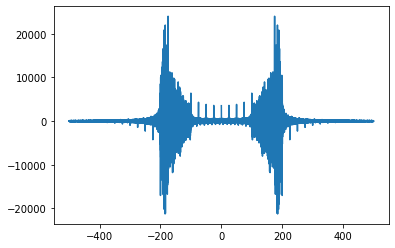

In [9]:
f = fft(audio)
freq = fftfreq(len(audio),1/SAMPLE_RATE)

# we are pretty low frequency signals so lets zoom in
zoom_idx = np.argwhere(abs(freq) < 500)
f = f[zoom_idx]
freq = freq[zoom_idx]
plt.plot(freq, f)

So we don't have high frequency noise, we do seem some very strange artifacts though

/home/zach/.local/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


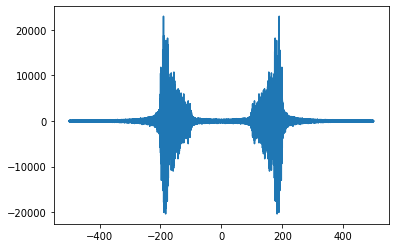

In [10]:
f = fft(audio_adjusted)
freq = fftfreq(len(audio_adjusted),1/SAMPLE_RATE)

# we are pretty low frequency signals so lets zoom in
zoom_idx = np.argwhere(abs(freq) < 500)
f = f[zoom_idx]
freq = freq[zoom_idx]
plt.plot(freq, f)

So it appears shifting phase helped get rid of those artifacts, there still are some "popping" artifacts that though. Not sure how to remove those at this time.